## Install packages

In [1]:
import os
from fastapi import FastAPI, HTTPException
from pydantic import BaseModel
from typing import List
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_google_genai import GoogleGenerativeAIEmbeddings
import google.generativeai as genai
from langchain_community.vectorstores import FAISS
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain.chains.question_answering import load_qa_chain
from langchain.prompts import PromptTemplate
import csv
from dotenv import load_dotenv
import json
from contextlib import asynccontextmanager
import getpass
import requests
from PIL import Image
from langchain_core.messages import HumanMessage, SystemMessage
from langchain.vectorstores import DocArrayInMemorySearch
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate

from langchain_text_splitters import CharacterTextSplitter
from langchain.schema.document import Document
from langchain_community.document_loaders import TextLoader

from langchain_core.runnables import RunnableLambda, RunnablePassthrough

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Markdown

In [2]:
from langchain_community.vectorstores import FAISS

## Set API Key

In [3]:
# Load environment variables
load_dotenv()
genai.configure(api_key=os.getenv("GOOGLE_API_KEY"))
if "GOOGLE_API_KEY" not in os.environ:
    os.environ["GOOGLE_API_KEY"] = getpass.getpass(os.getenv("GOOGLE_API_KEY"))

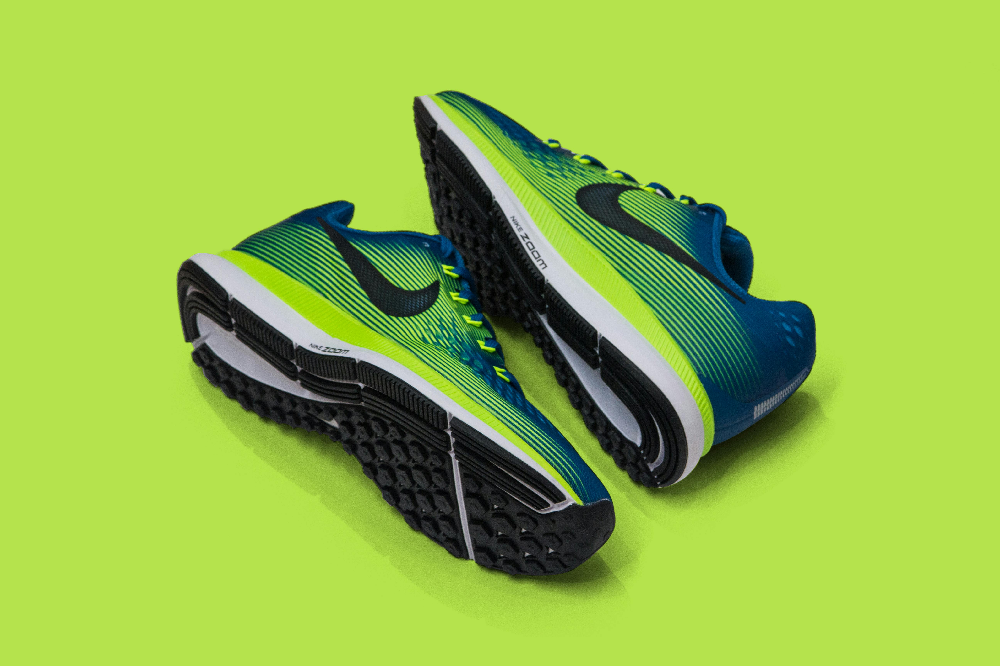

In [47]:
img_path = "pexels-craytive-1456706.jpg"
img = Image.open('pexels-craytive-1456706.jpg')
img

In [48]:
llm = ChatGoogleGenerativeAI(model="gemini-pro-vision")
prompt = "what you see in the image?"

message = HumanMessage(
    content=[
        {
            "type": "text",
            "text": prompt,
        },
        {"type": "image_url", "image_url": img_path},
    ]
)

result = llm.invoke([message])
print(result.content)

 A pair of blue and green Nike Zoom running shoes against a bright green background.


In [49]:
import csv

def read_csv_data():
    csv_files = "./dataset/cosmetic_clean_final.csv"
    all_data = []  # List to hold all data rows with column names
    
    with open(csv_files, 'r', encoding='utf-8') as file:
        csv_text = file.read()
    csv_reader = csv.reader(csv_text.splitlines())
    
    headers = next(csv_reader)  # Extracting the header row
    for row in csv_reader:
        if row:  # Ensuring the row is not empty
            row_data = {headers[i]: row[i] for i in range(len(row))}  # Create a dict with column names
            all_data.append(row_data)
    return all_data  # Return the list of dictionaries

In [57]:
raw_text = read_csv_data()

In [50]:
def get_text_chunks(data):
    text = ""
    # Convert list of dictionaries to a structured string
    for entry in data:
        formatted_entry = ' '.join(f"{key}: {value}" for key, value in entry.items())
        text += formatted_entry + "\n"  # Separate entries with triple newlines

    splitter = RecursiveCharacterTextSplitter(
        separators=['\n'],
        chunk_size=10000, chunk_overlap=1000)
    chunks = splitter.split_text(text)
    return chunks

In [58]:
text_chunks = get_text_chunks(raw_text)

In [63]:
# get embeddings for each chunk
def get_vector_store(chunks):
    embeddings = GoogleGenerativeAIEmbeddings(
        model="models/embedding-001"
    )
    vector_store = FAISS.from_texts(chunks, embedding=embeddings)
    vector_store.save_local("faiss_index")
    return vector_store

In [59]:
if text_chunks:  # Check if text_chunks is not empty
        get_vector_store(text_chunks)
else:
    print("No data found in CSV files.")

In [64]:
text = get_vector_store(text_chunks)

In [66]:
retriever = text.as_retriever()

This is to test the result

In [69]:
retriever.invoke("i want to buy a lipstick with high rating and price within 100")

[Document(page_content="product_name: Kiss Kiss Shine Bloom Lipstick - 749 Love Tulip category: lips subcategory: lipstick ingredients: Polyglyceryl-2 Triisostearate, Squalane, Hydrogenated Castor  Dimer Dilinoleate, Bis-Behenyl/Isostearyl/Phytosteryl Dimer Dilinoleyl Dimer Dilinoleate, Helianthus Annuus (Sunflower) Seed Wax, Euphorbia Cerifera (Candelilla) Wax Extract, Trimethylolpropane Triisostearate, Camellia Japonica Seed , Hydrogenated Castor  Isostearate, Ethylhexyl Palmitate, Cera Alba (Beeswax), Butyrospermum Parkii (Shea) Butter, Oryza Sativa (Rice) Bran Wax, Parfum (Fragrance), Caprylic/Capric Triglyceride, Butyrospermum Parkii (Shea) Butter Unsaponifiables, Commiphora Mukul Resin Extract, Ammonium Glycyrrhizate, Pentaerythrityl Tetra-Di-T-Butyl Hydroxyhydrocinnamate, Tocopherol, Ascorbyl Palmitate, Helianthus Annuus (Sunflower) Seed , Trihydroxystearin, Propyl Gallate, Sodium Hyaluronate, Benzyl Alcohol, Glucomannan, Ci 77891 (Titanium Dioxide), Ci 77491, 77499 (Iron Oxides

In [84]:
llm_text = ChatGoogleGenerativeAI(model="gemini-1.5-flash")
template = """
    You are a CSV data assistant who help user to find product. 
    Your task is to retrieve information from the provided CSV file. 
    Your goal is to provide accurate answers based on the context of the data. 
    You should always suggest the several most similar and suitable product from csv based on user prompt.
    The resopnse should be a list with the product_name,category,subcategory,rating_count,product_price,product_ratings
    You can suggest more than one product.
    Use the provided context and question to generate an accurate response. 
    Your result must be in json format.

    Product_name: The name of the product.
    Category: The category of cosmetic product. 
    Subcategory: The sub-category of the product.
    product_price: The price of the product in Malaysia Ringgit.
    Ingredients: The ingredients of each product.
    Form: The consistency of the product.
    Type: Additional information about the product.
    Color: The color of product.
    Size: The volume of product in ml.
    product_ratings: The customer rating of the product. (0 to 5)
    rating_count,: The number of customers who rated that product.

```
{context}
```

{information}


"""
prompt = ChatPromptTemplate.from_template(template)

rag_chain = (
    {"context": retriever, "information": RunnablePassthrough()}
    | prompt
    | llm_text
    | StrOutputParser()
)

In [88]:
llm_vision = ChatGoogleGenerativeAI(model="gemini-1.5-flash", temperature=0.0)
full_chain = (
    RunnablePassthrough() | llm_vision | StrOutputParser() | rag_chain
)

In [73]:
result = rag_chain.invoke("Where can I buy the cheapest lipstick")
display(Markdown(result))

{
 "product_name": "Color Sensational Ultimatte Slim Lipstick",
 "category": "lips",
 "subcategory": "lipstick",
 "product_price": "43.73",
 "product_ratings": "4.5"
}

In [99]:
image = "37ed4f68-c729-4b1c-9c20-f29f7bdfde30.jpg"
# plt.imshow(image)
# plt.show()

message = HumanMessage(
    content=[
        {
            "type": "text",
            "text": "Suggest me a face wash and serum for my face",
        },  # You can optionally provide text parts
        {"type": "image_url", "image_url": image},
    ]
)


result = full_chain.invoke([message])
display(Markdown(result))

```json
[
  {
    "product_name": "Lazy Day All-In-One Moisture Pads",
    "category": "skincare",
    "subcategory": "moisturizer",
    "rating_count": 349,
    "product_price": 198.14,
    "product_ratings": 4.7
  },
  {
    "product_name": "Acne Oil-Free Moisturizer",
    "category": "skincare",
    "subcategory": "moisturizer",
    "rating_count": 87,
    "product_price": 59.87,
    "product_ratings": 4.3
  },
  {
    "product_name": "Redness Relief Color Correcting Moisturizer",
    "category": "skincare",
    "subcategory": "moisturizer",
    "rating_count": 37,
    "product_price": 92.13,
    "product_ratings": 3.8
  },
  {
    "product_name": "Water Drench Broad Spectrum SPF 45 Hyaluronic Cloud Moisturizer",
    "category": "skincare",
    "subcategory": "moisturizer",
    "rating_count": 162,
    "product_price": 106.0,
    "product_ratings": 4.1
  },
  {
    "product_name": "Water Drench Hyaluronic Liquid Gel Cloud Serum",
    "category": "skincare",
    "subcategory": "moisturizer",
    "rating_count": 270,
    "product_price": 313.38,
    "product_ratings": 4.2
  }
]
```